<a href="https://colab.research.google.com/github/lmencisoe/CDA/blob/main/Taller1_CDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install --upgrade pandas-profiling
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Importing libraries

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport

%matplotlib inline

Vamos a leer la data y remover duplicados

In [ ]:
data_taller1 = pd.read_csv('https://raw.githubusercontent.com/lmencisoe/CDA/main/Data_Taller_1_.csv', sep=';')
data_taller1 = data_taller1.drop_duplicates()
data_taller1.shape
data_taller1.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000.0,77.0,0.751,0.834,1.0,-5.444,0.0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999.0,79.0,0.434,0.897,0.0,-4.918,1.0,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546.0,False,1999.0,66.0,0.529,0.496,7.0,-9.007,1.0,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493.0,False,2000.0,78.0,0.551,0.913,0.0,-4.063,0.0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,False,2000.0,NaN,0.614,0.928,8.0,-4.806,0.0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop


Ahora, vamos a crear una columna por cada género de la canción.
Luego hacemos el join con la data original y dejamos registros de todos los géneros por a parte.


In [ ]:
data_cancion_genero = data_taller1[['artist', 'song', 'genre']]
generos = data_cancion_genero['genre'].str.split(',', expand=True)
generos.columns = ['genre_1', 'genre_2', 'genre_3', 'genre_4']
data_taller1['genre_1'] = generos['genre_1'].str.strip()
data_taller1['genre_2'] = generos['genre_2'].str.strip()
data_taller1['genre_3'] = generos['genre_3'].str.strip()
data_taller1['genre_4'] = generos['genre_4'].str.strip()
data_taller1 = data_taller1[['artist',
                             'song',
                             'genre',
                             'duration_ms',
                             'explicit',
                             'year',
                             'popularity',
                             'danceability',
                             'energy',
                             'key',
                             'loudness',
                             'mode',
                             'speechiness',
                             'acousticness',
                             'instrumentalness',
                             'liveness',	
                             'valence',	
                             'tempo',
                             'genre_1',
                             'genre_2',
                             'genre_3',
                             'genre_4']]
data_taller1.head()

,artist,song,genre,duration_ms,explicit,year,popularity,danceability,energy,key,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre_1,genre_2,genre_3,genre_4
0,Britney Spears,Oops!...I Did It Again,pop,211160.0,False,2000.0,77.0,0.751,0.834,1.0,...,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop,None,None,None
1,blink-182,All The Small Things,"rock, pop",167066.0,False,1999.0,79.0,0.434,0.897,0.0,...,0.0488,0.0103,0.000000,0.6120,0.684,148.726,rock,pop,None,None
2,Faith Hill,Breathe,"pop, country",250546.0,False,1999.0,66.0,0.529,0.496,7.0,...,0.0290,0.1730,0.000000,0.2510,0.278,136.859,pop,country,None,None
3,Bon Jovi,It's My Life,"rock, metal",224493.0,False,2000.0,78.0,0.551,0.913,0.0,...,0.0466,0.0263,0.000013,0.3470,0.544,119.992,rock,metal,None,None
4,*NSYNC,Bye Bye Bye,pop,200560.0,False,2000.0,NaN,0.614,0.928,8.0,...,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop,None,None,None


In [ ]:
data_taller1.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Punto 1**

Ahora, vamos a seleccionar el top 10 de artistas mas activos de los últimos 10 años por los artistas que sumen mas minutos en sus canciones en los últimos 10 años.

In [ ]:
data_taller1['duration_min'] = data_taller1['duration_ms']/60000 # Convertimos a minutos
data_taller1[data_taller1['year'] >= 2011].groupby('artist')['duration_min'].sum().sort_values(ascending=False).head(10)

artist
Drake            71.303833
Calvin Harris    66.691967
Taylor Swift     46.925500
Ariana Grande    45.573033
David Guetta     43.801317
Katy Perry       41.158750
Chris Brown      39.417267
Ed Sheeran       34.873317
Avicii           34.176300
Maroon 5         33.604150
Name: duration_min, dtype: float64

# **Punto 2**

Ahora, vamos a seleccionar los géneros latin y folk/acoustic y ver su tiempo promedio.

In [ ]:
cancion_generos_duracion = data_taller1[['song', 'genre','genre_1','genre_2','genre_3','genre_4', 'duration_min']]
genre1 = cancion_generos_duracion[cancion_generos_duracion['genre_1'].isin(['latin','Folk/Acoustic'])]
genre2 = cancion_generos_duracion[cancion_generos_duracion['genre_2'].isin(['latin','Folk/Acoustic'])]
genre3 = cancion_generos_duracion[cancion_generos_duracion['genre_3'].isin(['latin','Folk/Acoustic'])]
genre4 = cancion_generos_duracion[cancion_generos_duracion['genre_4'].isin(['latin','Folk/Acoustic'])]
frames = [genre1, genre2, genre3, genre4]
latin_folk = pd.concat(frames)
latin_folk = latin_folk[['genre_1', 'genre_2', 'genre_3', 'genre_4', 'duration_min']]
latin_folk = latin_folk.melt(id_vars='duration_min')
latin_folk = latin_folk[latin_folk['value'].isin(['latin','Folk/Acoustic'])]

,duration_min,variable,value
0,4.644433,genre_1,Folk/Acoustic
1,3.958217,genre_1,Folk/Acoustic
2,3.210000,genre_1,latin
3,4.086217,genre_1,Folk/Acoustic
4,3.566433,genre_1,latin


In [ ]:
latin_folk.groupby('value').agg({'duration_min': ['mean','count']})

duration_min      
                      mean count
value                           
Folk/Acoustic     3.669727    20
latin             3.791578    63

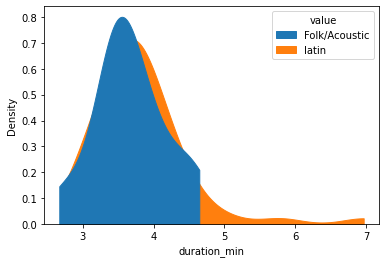

In [ ]:
sns.kdeplot(data=latin_folk, x="duration_min", hue="value", cut=0, fill=True, common_norm=False, alpha=1)
plt.show()

# **Punto 3**
Top 5 de géneros de 2019 según la cantidad de canciones.

In [ ]:
data_2019 = data_taller1[data_taller1['year'] == 2019]
data_2019_generos = data_2019[['song','genre_1','genre_2','genre_3','genre_4']]
data_2019_generos = data_2019_generos.melt(id_vars='song')
data_2019_generos = data_2019_generos[['value', 'song']]
data_2019_generos = data_2019_generos[data_2019_generos.value.notnull()]
data_2019_generos.groupby('value').count().sort_values('song', ascending=False).head()

,song
value,
pop,63
hip hop,38
Dance/Electronic,21
R&B,9
latin,8


Top 5 de los años 200,2005,2010,2015 y 2019

In [ ]:
data_years = data_taller1[data_taller1['year'].isin([2000,2005,2010,2015,2019])]
data_years = data_years[['year','genre_1','genre_2','genre_3','genre_4']]
data_years = data_years.melt(id_vars='year')
data_years = data_years[data_years.value.notnull()]
data_years = data_years.groupby(['year','value']).count().sort_values(['year', 'variable'],ascending = [True, False])
data_years['conteo'] = data_years.groupby('year').cumcount()
data_years = data_years[data_years['conteo'] <= 4]


variable  conteo
year   value                             
2000.0 pop                     55       0
       R&B                     24       1
       hip hop                 20       2
       rock                    12       3
       metal                    7       4
2005.0 pop                     78       0
       hip hop                 50       1
       R&B                     30       2
       rock                    18       3
       Dance/Electronic         5       4
2010.0 pop                     94       0
       hip hop                 52       1
       Dance/Electronic        28       2
       R&B                     22       3
       rock                     6       4
2015.0 pop                     83       0
       hip hop                 29       1
       Dance/Electronic        28       2
       R&B                     19       3
       rock                    13       4
2019.0 pop                     63       0
       hip hop                 38       1
       Dance/Electronic        21       2
       R&B                      9       3
       latin                    8       4

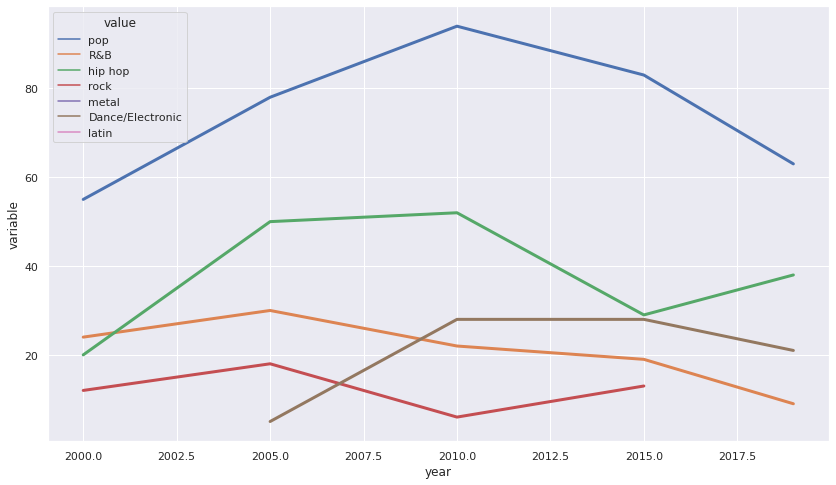

In [ ]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=data_years, x ='year', y = 'variable',
                  hue='value', 
                  legend='full',
                  lw=3)

# **Punto 4**
Progresión de nuevos artistas

In [ ]:
data_artist_year = data_taller1.groupby('artist', as_index=False)['year'].agg({'min_year':'min'})
data_artist_year = pd.DataFrame(data_artist_year)
data_artist_year = data_artist_year.groupby('min_year', as_index=False)['artist'].agg({'conteo_artists':'count'})

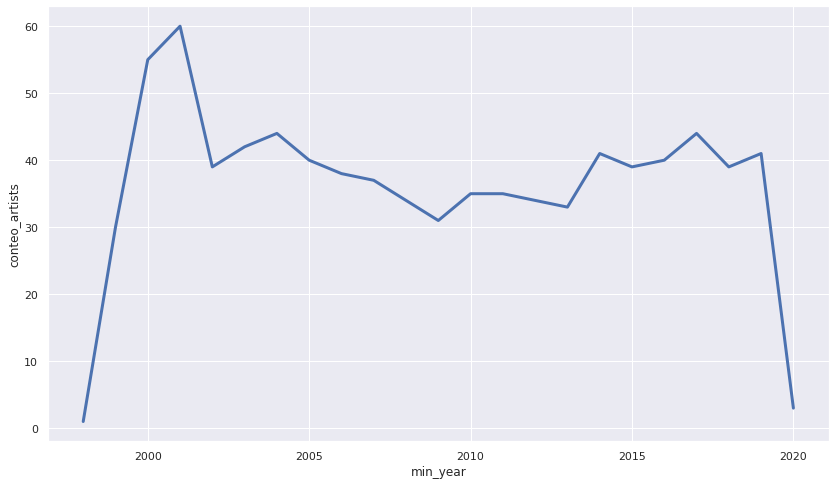

In [ ]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=data_artist_year, x ='min_year', y = 'conteo_artists',
                  legend='full',
                  lw=3)

# **Punto 5**
Progresión de popularidad promedio por género y por año.

In [ ]:
data_year_popularity = data_taller1[['year','song','genre_1','genre_2','genre_3','genre_4','popularity']]
data_year_popularity = data_year_popularity.melt(id_vars=['year','song','popularity'])
data_year_popularity = data_year_popularity[data_year_popularity.value.notnull()]
data_year_popularity = data_year_popularity.groupby(['year','value'], as_index=False)['popularity'].agg({'mean_popularity':'mean'})

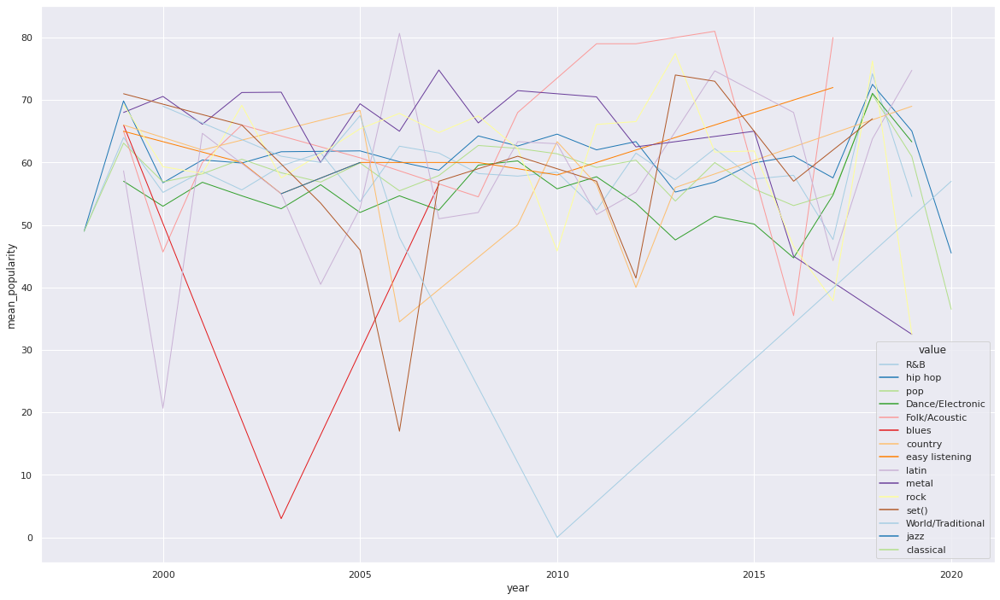

In [ ]:
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(20,12)})

ax = sns.lineplot(data=data_year_popularity, x ='year', y = 'mean_popularity',
                  hue='value', 
                  palette='Paired',
                  legend='full',
                  lw=1)

# **Punto 6**
Comparación de pop y rock.

In [ ]:
data_rock_pop = data_taller1[['song','genre_1','genre_2','genre_3','genre_4','energy', 'valence', 'tempo']]
data_rock_pop = data_rock_pop.melt(id_vars=['song','energy', 'valence', 'tempo'])
data_rock_pop = data_rock_pop[data_rock_pop.value.notnull()]
data_rock_pop = data_rock_pop[data_rock_pop['value'].isin (['pop','rock'])]
data_rock_pop.groupby(['value'], as_index=False)['energy','valence','tempo'].agg(['mean','median'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



energy           valence               tempo          
           mean  median      mean  median        mean    median
value                                                          
pop    0.715795  0.7320  0.554571  0.5595  119.741517  120.0175
rock   0.791027  0.8295  0.527743  0.5320  126.155839  124.3950

,artist,song,genre,duration_ms,explicit,year,popularity,danceability,energy,key,...,acousticness,instrumentalness,liveness,valence,tempo,genre_1,genre_2,genre_3,genre_4,duration_min
0,Britney Spears,Oops!...I Did It Again,pop,211160.0,False,2000.0,77.0,0.751,0.834,1.0,...,0.3000,0.000018,0.3550,0.894,95.053,pop,None,None,None,3.519333
1,blink-182,All The Small Things,"rock, pop",167066.0,False,1999.0,79.0,0.434,0.897,0.0,...,0.0103,0.000000,0.6120,0.684,148.726,rock,pop,None,None,2.784433
2,Faith Hill,Breathe,"pop, country",250546.0,False,1999.0,66.0,0.529,0.496,7.0,...,0.1730,0.000000,0.2510,0.278,136.859,pop,country,None,None,4.175767
3,Bon Jovi,It's My Life,"rock, metal",224493.0,False,2000.0,78.0,0.551,0.913,0.0,...,0.0263,0.000013,0.3470,0.544,119.992,rock,metal,None,None,3.741550
4,*NSYNC,Bye Bye Bye,pop,200560.0,False,2000.0,NaN,0.614,0.928,8.0,...,0.0408,0.001040,0.0845,0.879,172.656,pop,None,None,None,3.342667
